<a href="https://colab.research.google.com/github/HasithaGallella/EN3160-Image-Processing-and-Machine-Vision/blob/main/Assignments/EN3160_210174X_A02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**EN3160 Assignment 01:** Intensity Transformations and Neighborhood Filtering

- Name: M.M.H.H.B Gallella
- Index No.: 210174X
- Submission Date: 23rd of October 2024
- GitHub: https://github.com/HasithaGallella
- Assignment Codes on: Google Colab

# Question 1 – Sunflower field Blob Detection

Largest circle using LoG: Center=(0.00, 234.00), Radius=42.43
Largest circle using DoG: Center=(0.00, 237.00), Radius=26.84


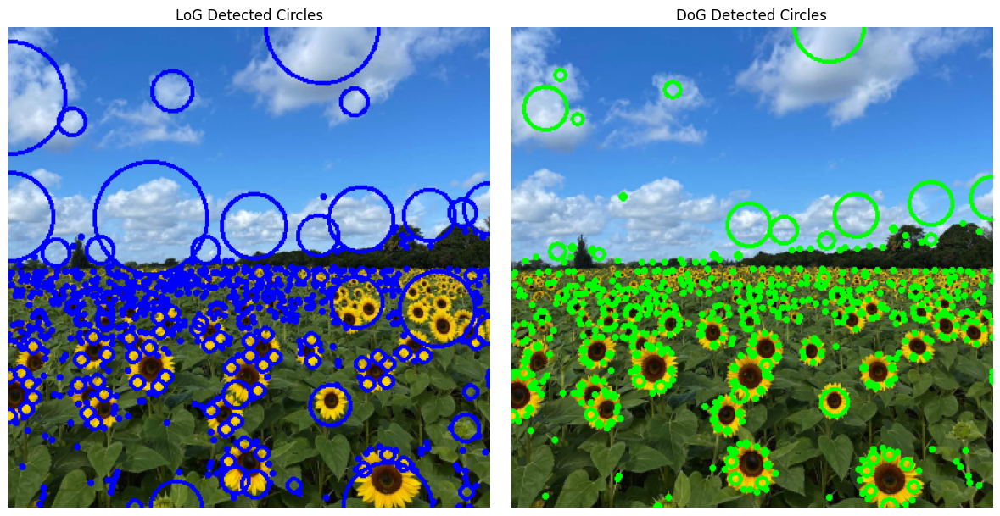

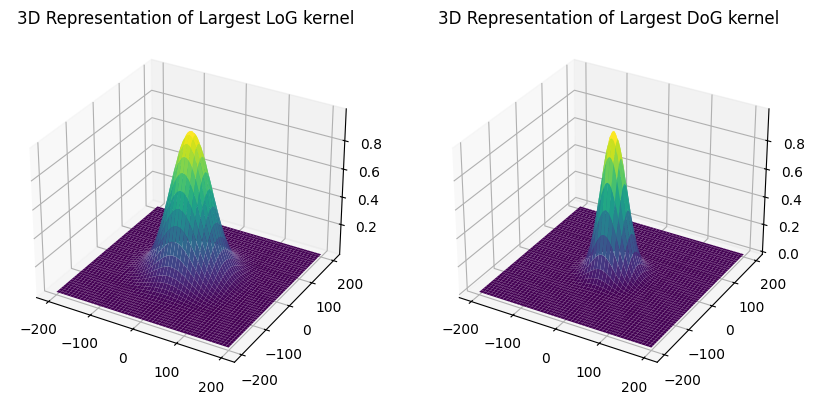

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import blob_log, blob_dog
from mpl_toolkits.mplot3d import Axes3D

# Load the sunflower field image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)

# Convert image to grayscale
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)

# Detect blobs using Laplacian of Gaussian (LoG) method
blobs_log = blob_log(gray, max_sigma=30, num_sigma=10, threshold=0.1)
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)  # Convert sigma to radius

# Detect blobs using Difference of Gaussian (DoG) method
blobs_dog = blob_dog(gray, max_sigma=30, threshold=0.1)

# Draw the detected circles on the image for LoG
im_log = im.copy()
for blob in blobs_log:
    y, x, r = blob
    cv.circle(im_log, (int(x), int(y)), int(r), (255, 0, 0), 2)

# Draw the detected circles on the image for DoG
im_dog = im.copy()
for blob in blobs_dog:
    y, x, r = blob
    cv.circle(im_dog, (int(x), int(y)), int(r), (0, 255, 0), 2)

# Find the largest circle for LoG
if len(blobs_log) > 0:
    largest_blob_log = max(blobs_log, key=lambda b: b[2])
    x_largest_log, y_largest_log, radius_largest_log = largest_blob_log
    print(f"Largest circle using LoG: Center=({x_largest_log:.2f}, {y_largest_log:.2f}), Radius={radius_largest_log:.2f}")
else:
    print("No circles detected using LoG.")

# Find the largest circle for DoG
if len(blobs_dog) > 0:
    largest_blob_dog = max(blobs_dog, key=lambda b: b[2])
    x_largest_dog, y_largest_dog, radius_largest_dog = largest_blob_dog
    print(f"Largest circle using DoG: Center=({x_largest_dog:.2f}, {y_largest_dog:.2f}), Radius={radius_largest_dog:.2f}")
else:
    print("No circles detected using DoG.")

# Display the images with detected circles
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv.cvtColor(im_log, cv.COLOR_BGR2RGB))
axes[0].set_title('LoG Detected Circles')
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(im_dog, cv.COLOR_BGR2RGB))
axes[1].set_title('DoG Detected Circles')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Plot the largest blobs as 3D matrix images
if len(blobs_log) > 0:
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(121, projection='3d')
    x = np.linspace(-200, 200, 400)
    y = np.linspace(-200, 200, 400)
    X, Y = np.meshgrid(x, y)
    Z = np.exp(-(X**2 + Y**2) / (2 * (radius_largest_log**2)))
    ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.set_title('3D Representation of Largest LoG kernel')

if len(blobs_dog) > 0:
    ax = fig.add_subplot(122, projection='3d')
    x = np.linspace(-200, 200, 400)
    y = np.linspace(-200, 200, 400)
    X, Y = np.meshgrid(x, y)
    Z = np.exp(-(X**2 + Y**2) / (2 * (radius_largest_dog**2)))
    ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.set_title('3D Representation of Largest DoG kernel')

plt.show()


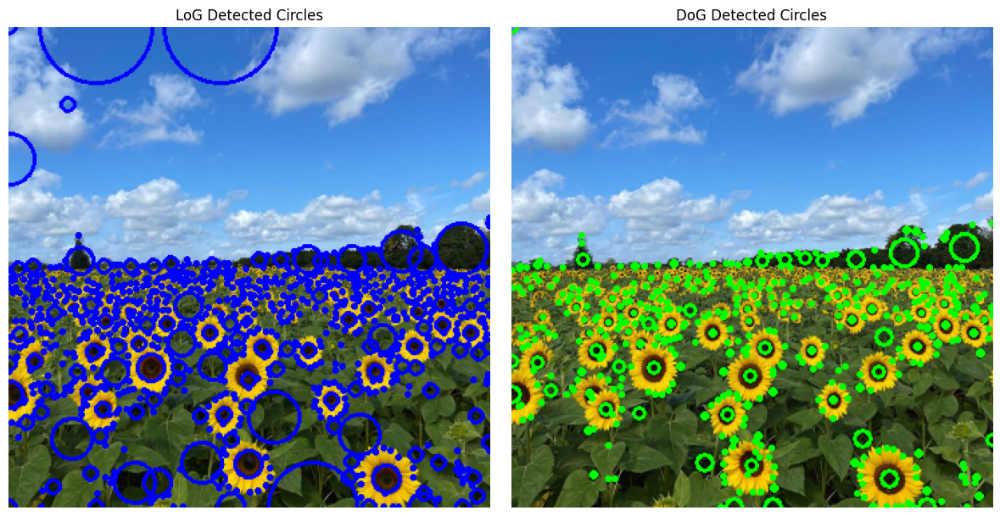

Largest circle using LoG: Center=(0.00, 65.00), Radius=42.43
Largest circle using DoG: Center=(165.00, 338.00), Radius=10.49


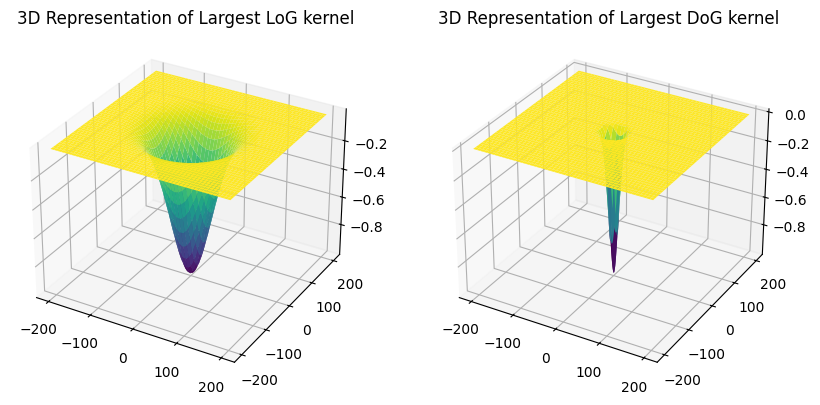

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import blob_log, blob_dog
from mpl_toolkits.mplot3d import Axes3D

# Load the sunflower field image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)

# Invert the image to focus on black blobs
im_inverted = cv.bitwise_not(im)

# Convert image to grayscale
gray = cv.cvtColor(im_inverted, cv.COLOR_BGR2GRAY)

# Detect blobs using Laplacian of Gaussian (LoG) method
blobs_log = blob_log(gray, max_sigma=30, num_sigma=10, threshold=0.1)
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)  # Convert sigma to radius

# Detect blobs using Difference of Gaussian (DoG) method
blobs_dog = blob_dog(gray, max_sigma=30, threshold=0.1)

# Draw the detected circles on the image for LoG
im_log = im.copy()
for blob in blobs_log:
    y, x, r = blob
    cv.circle(im_log, (int(x), int(y)), int(r), (255, 0, 0), 2)

# Draw the detected circles on the image for DoG
im_dog = im.copy()
for blob in blobs_dog:
    y, x, r = blob
    cv.circle(im_dog, (int(x), int(y)), int(r), (0, 255, 0), 2)

# Display the images with detected circles
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv.cvtColor(im_log, cv.COLOR_BGR2RGB))
axes[0].set_title('LoG Detected Circles')
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(im_dog, cv.COLOR_BGR2RGB))
axes[1].set_title('DoG Detected Circles')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Find the largest circle for LoG
if len(blobs_log) > 0:
    largest_blob_log = max(blobs_log, key=lambda b: b[2])
    x_largest_log, y_largest_log, radius_largest_log = largest_blob_log
    print(f"Largest circle using LoG: Center=({x_largest_log:.2f}, {y_largest_log:.2f}), Radius={radius_largest_log:.2f}")
else:
    print("No circles detected using LoG.")

# Find the largest circle for DoG
if len(blobs_dog) > 0:
    largest_blob_dog = max(blobs_dog, key=lambda b: b[2])
    x_largest_dog, y_largest_dog, radius_largest_dog = largest_blob_dog
    print(f"Largest circle using DoG: Center=({x_largest_dog:.2f}, {y_largest_dog:.2f}), Radius={radius_largest_dog:.2f}")
else:
    print("No circles detected using DoG.")

# Plot the largest blobs as 3D matrix images
if len(blobs_log) > 0:
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(121, projection='3d')
    x = np.linspace(-200, 200, 400)
    y = np.linspace(-200, 200, 400)
    X, Y = np.meshgrid(x, y)
    Z = -np.exp(-(X**2 + Y**2) / (2 * (radius_largest_log**2)))
    ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.set_title('3D Representation of Largest LoG kernel')

if len(blobs_dog) > 0:
    ax = fig.add_subplot(122, projection='3d')
    x = np.linspace(-200, 200, 400)
    y = np.linspace(-200, 200, 400)
    X, Y = np.meshgrid(x, y)
    Z = -np.exp(-(X**2 + Y**2) / (2 * (radius_largest_dog**2)))
    ax.plot_surface(X, Y, Z, cmap='viridis')
    ax.set_title('3D Representation of Largest DoG kernel')

plt.show()


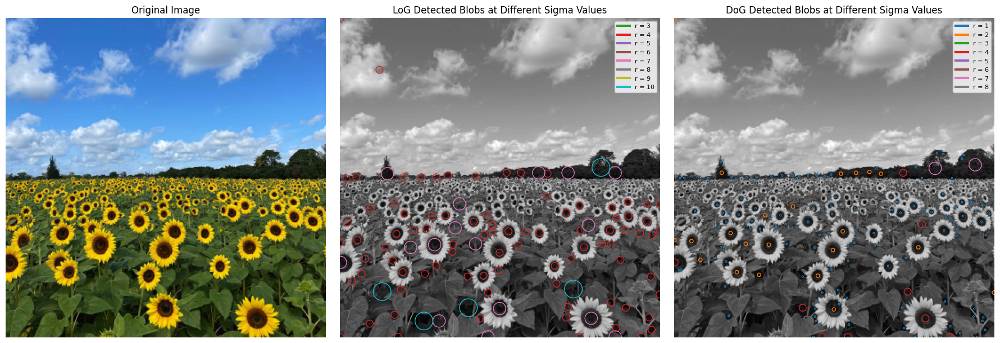

Largest circle using LoG: Center=(0.00, 65.00), Radius=42.43
Largest circle using DoG: Center=(165.00, 338.00), Radius=10.49


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from skimage.feature import blob_log, blob_dog

# Load the sunflower field image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)

# Invert the image to focus on black blobs
im_inverted = cv.bitwise_not(im)

# Convert image to grayscale
gray = cv.cvtColor(im_inverted, cv.COLOR_BGR2GRAY)

# Detect blobs using Laplacian of Gaussian (LoG) method
blobs_log = blob_log(gray, max_sigma=30, num_sigma=10, threshold=0.1)
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)  # Convert sigma to radius

# Detect blobs using Difference of Gaussian (DoG) method
blobs_dog = blob_dog(gray, max_sigma=30, threshold=0.1)

# Display the original image and detected blobs for different sigma values
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original image
axes[0].imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

# Draw the detected circles on the image for LoG with different colors for each radius
im_log_gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY) / 255
colors = list(mcolors.TABLEAU_COLORS)
patches_log = []
labels_log = []

for r in range(3, 11):
    sigma = r / 1.414
    current_blobs_log = [blob for blob in blobs_log if int(blob[2] / np.sqrt(2)) == r]
    for blob in current_blobs_log:
        y, x, _ = blob
        c = plt.Circle((x, y), sigma * 1.414, color=colors[r - 1], linewidth=1, fill=False)
        axes[1].add_patch(c)
    patches_log.append(plt.Line2D([0], [0], color=colors[r - 1], linewidth=3))
    labels_log.append(f'r = {r}')
axes[1].imshow(im_log_gray, cmap='gray')
axes[1].set_title('LoG Detected Blobs at Different Sigma Values')
axes[1].axis('off')
axes[1].legend(patches_log, labels_log, loc='best', fontsize=8)

# Draw the detected circles on the image for DoG with different colors for each radius
im_dog_gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY) / 255
patches_dog = []
labels_dog = []

for r in range(1, 9):
    sigma = r / 1.414
    current_blobs_dog = [blob for blob in blobs_dog if int(blob[2] / np.sqrt(2)) == r]
    for blob in current_blobs_dog:
        y, x, _ = blob
        c = plt.Circle((x, y), sigma * 1.414, color=colors[r - 1], linewidth=1, fill=False)
        axes[2].add_patch(c)
    patches_dog.append(plt.Line2D([0], [0], color=colors[r - 1], linewidth=3))
    labels_dog.append(f'r = {r}')
axes[2].imshow(im_dog_gray, cmap='gray')
axes[2].set_title('DoG Detected Blobs at Different Sigma Values')
axes[2].axis('off')
axes[2].legend(patches_dog, labels_dog, loc='best', fontsize=8)

plt.tight_layout()
plt.show()

# Find the largest circle for LoG
if len(blobs_log) > 0:
    largest_blob_log = max(blobs_log, key=lambda b: b[2])
    x_largest_log, y_largest_log, radius_largest_log = largest_blob_log
    print(f"Largest circle using LoG: Center=({x_largest_log:.2f}, {y_largest_log:.2f}), Radius={radius_largest_log:.2f}")
else:
    print("No circles detected using LoG.")

# Find the largest circle for DoG
if len(blobs_dog) > 0:
    largest_blob_dog = max(blobs_dog, key=lambda b: b[2])
    x_largest_dog, y_largest_dog, radius_largest_dog = largest_blob_dog
    print(f"Largest circle using DoG: Center=({x_largest_dog:.2f}, {y_largest_dog:.2f}), Radius={radius_largest_dog:.2f}")
else:
    print("No circles detected using DoG.")


Click on four points on the architectural image to select the region for the flag.


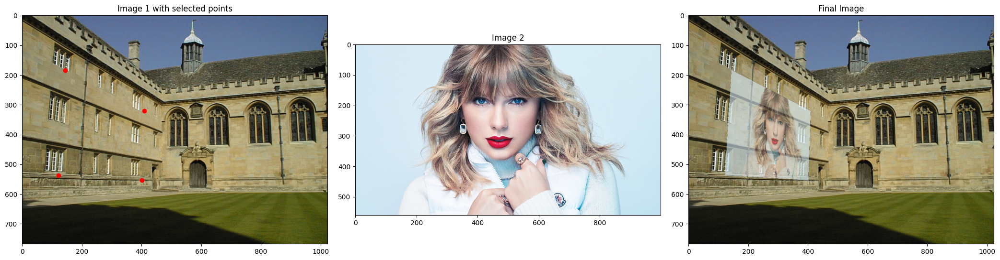

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Load the architectural image and the flag image
architectural_img = cv.imread('005.jpg')  # Replace with your architectural image path
flag_img = cv.imread('taylor.jpg')  # Replace with the flag image path

if architectural_img is None or flag_img is None:
    print("Error: Could not load images. Please check the file paths.")
    exit()

# Initialize list to store points clicked by the user
points_architectural = []

# Mouse click event callback function
def select_points(event, x, y, flags, param):
    global points_architectural
    if event == cv.EVENT_LBUTTONDOWN:
        points_architectural.append([x, y])
        cv.circle(architectural_img_display, (x, y), 5, (0, 0, 255), -1)
        cv.imshow("Select 4 Points", architectural_img_display)

# Create a copy for display purposes
architectural_img_display = architectural_img.copy()

# Set up window and mouse callback
cv.namedWindow("Select 4 Points", cv.WINDOW_AUTOSIZE)
cv.setMouseCallback("Select 4 Points", select_points)

# Display the image until 4 points are selected
print("Click on four points on the architectural image to select the region for the flag.")
while len(points_architectural) < 4:
    cv.imshow("Select 4 Points", architectural_img_display)
    if cv.waitKey(10) & 0xFF == 27:  # Press 'Esc' key to exit if needed
        print("User canceled point selection.")
        cv.destroyAllWindows()
        exit()

cv.destroyAllWindows()

# Convert points to NumPy array of type float32
points_architectural = np.array(points_architectural, dtype='float32')

# Get the dimensions of the flag image
height, width, _ = flag_img.shape

# Define the four corners of the flag image
points_flag = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]], dtype='float32')

# Compute the homography matrix
homography_matrix, _ = cv.findHomography(points_flag, points_architectural)

# Warp the flag image to fit the selected region in the architectural image
warped_flag = cv.warpPerspective(flag_img, homography_matrix, (architectural_img.shape[1], architectural_img.shape[0]))

# Create a mask from the warped flag image
mask = np.zeros_like(architectural_img, dtype=np.uint8)
cv.fillConvexPoly(mask, points_architectural.astype(int), (255, 255, 255))

# Blend the warped flag image with reduced opacity to make it look more natural
alpha = 0.6  # Opacity level for blending
blended_warped_flag = cv.addWeighted(warped_flag, alpha, architectural_img, 1 - alpha, 0)

# Combine the blended flag with the architectural image
blended_img = cv.bitwise_and(architectural_img, cv.bitwise_not(mask)) + cv.bitwise_and(blended_warped_flag, mask)

# Plotting the results
fig, ax = plt.subplots(1, 3, figsize=(21, 7))
ax[0].imshow(cv.cvtColor(architectural_img, cv.COLOR_BGR2RGB))
ax[0].set_title("Image 1 with selected points")
for point in points_architectural:
    ax[0].plot(point[0], point[1], 'ro')

ax[1].imshow(cv.cvtColor(flag_img, cv.COLOR_BGR2RGB))
ax[1].set_title("Image 2")

ax[2].imshow(cv.cvtColor(blended_img, cv.COLOR_BGR2RGB))
ax[2].set_title("Final Image")

plt.tight_layout()
plt.show()

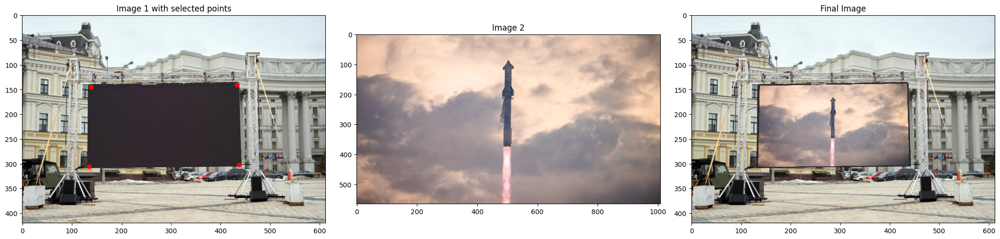

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

N = 4  # Number of points
n = 0

# Parameters of the two images
p = np.empty((N, 2))
p_flag = np.empty((N, 2))

# Mouse callback function
def draw(event, x, y, flags, param):
    global n
    p = param[0]
    if event == cv.EVENT_LBUTTONDOWN:
        cv.circle(param[1], (x, y), 5, (0, 0, 255), -1)
        p[n] = (x, y)
        n += 1

# Importing the images and creating copies
image_background = cv.imread('./images/big screen.jpg', cv.IMREAD_COLOR)
image_superimposed = cv.imread('./images/StarShip.png', cv.IMREAD_COLOR)
image_background_copy = image_background.copy()
image_superimposed_copy = image_superimposed.copy()

# Getting the mouse points of the base image
cv.namedWindow('Image', cv.WINDOW_AUTOSIZE)
param = [p, image_background_copy]
cv.setMouseCallback('Image', draw, param)
while True:
    cv.imshow('Image', image_background_copy)
    if n == N:
        break
    if cv.waitKey(20) & 0xFF == 27:
        break

# Getting the mouse points of the flag
n = 0
cv.namedWindow('Image Flag', cv.WINDOW_AUTOSIZE)
param = [p_flag, image_superimposed_copy]
cv.setMouseCallback('Image Flag', draw, param)
while True:
    cv.imshow('Image Flag', image_superimposed_copy)
    if n == N:
        break
    if cv.waitKey(20) & 0xFF == 27:
        break
cv.destroyAllWindows()

# Calculating homography between image and flag
h, status = cv.findHomography(p, p_flag)

# Warping image of flag
warped_img = cv.warpPerspective(image_superimposed, np.linalg.inv(h), (image_background.shape[1], image_background.shape[0]))

# Creating mask of the warped image to blend properly
warped_gray = cv.cvtColor(warped_img, cv.COLOR_BGR2GRAY)
_, mask = cv.threshold(warped_gray, 1, 255, cv.THRESH_BINARY)
mask_inv = cv.bitwise_not(mask)

# Black-out the area of the flag in the original image
background_part = cv.bitwise_and(image_background, image_background, mask=mask_inv)
flag_part = cv.bitwise_and(warped_img, warped_img, mask=mask)

# Blending the two images
final_image = cv.add(background_part, flag_part)

# Plotting the results
fig, ax = plt.subplots(1, 3, figsize=(21, 7))
ax[0].imshow(cv.cvtColor(image_background, cv.COLOR_BGR2RGB))
ax[0].set_title("Image 1 with selected points")
for point in p:
    ax[0].plot(point[0], point[1], 'ro')

ax[1].imshow(cv.cvtColor(image_superimposed, cv.COLOR_BGR2RGB))
ax[1].set_title("Image 2")

ax[2].imshow(cv.cvtColor(final_image, cv.COLOR_BGR2RGB))
ax[2].set_title("Final Image")

plt.tight_layout()
plt.show()

Click on four points on the architectural image to select the region for the flag.


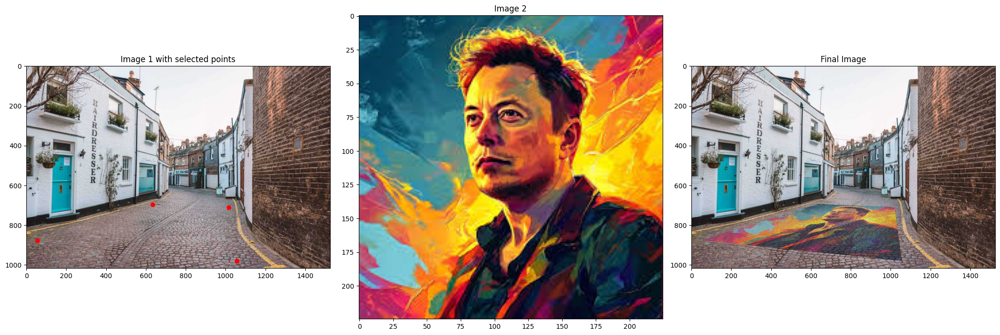

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Load the architectural image and the flag image
architectural_img = cv.imread('street2.jpg')  # Replace with your architectural image path
flag_img = cv.imread('Elon.jpeg')  # Replace with the flag image path

if architectural_img is None or flag_img is None:
    print("Error: Could not load images. Please check the file paths.")
    exit()

# Initialize list to store points clicked by the user
points_architectural = []

# Mouse click event callback function
def select_points(event, x, y, flags, param):
    global points_architectural
    if event == cv.EVENT_LBUTTONDOWN:
        points_architectural.append([x, y])
        cv.circle(architectural_img_display, (x, y), 5, (0, 0, 255), -1)
        cv.imshow("Select 4 Points", architectural_img_display)

# Create a copy for display purposes
architectural_img_display = architectural_img.copy()

# Set up window and mouse callback
cv.namedWindow("Select 4 Points", cv.WINDOW_AUTOSIZE)
cv.setMouseCallback("Select 4 Points", select_points)

# Display the image until 4 points are selected
print("Click on four points on the architectural image to select the region for the flag.")
while len(points_architectural) < 4:
    cv.imshow("Select 4 Points", architectural_img_display)
    if cv.waitKey(10) & 0xFF == 27:  # Press 'Esc' key to exit if needed
        print("User canceled point selection.")
        cv.destroyAllWindows()
        exit()

cv.destroyAllWindows()

# Convert points to NumPy array of type float32
points_architectural = np.array(points_architectural, dtype='float32')

# Get the dimensions of the flag image
height, width, _ = flag_img.shape

# Define the four corners of the flag image
points_flag = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]], dtype='float32')

# Compute the homography matrix
homography_matrix, _ = cv.findHomography(points_flag, points_architectural)

# Warp the flag image to fit the selected region in the architectural image
warped_flag = cv.warpPerspective(flag_img, homography_matrix, (architectural_img.shape[1], architectural_img.shape[0]))

# Create a mask from the warped flag image
mask = np.zeros_like(architectural_img, dtype=np.uint8)
cv.fillConvexPoly(mask, points_architectural.astype(int), (255, 255, 255))

# Blend the warped flag image with reduced opacity to make it look more natural
alpha = 0.6  # Opacity level for blending
blended_warped_flag = cv.addWeighted(warped_flag, alpha, architectural_img, 1 - alpha, 0)

# Combine the blended flag with the architectural image
blended_img = cv.bitwise_and(architectural_img, cv.bitwise_not(mask)) + cv.bitwise_and(blended_warped_flag, mask)

# Plotting the results
fig, ax = plt.subplots(1, 3, figsize=(21, 7))
ax[0].imshow(cv.cvtColor(architectural_img, cv.COLOR_BGR2RGB))
ax[0].set_title("Image 1 with selected points")
for point in points_architectural:
    ax[0].plot(point[0], point[1], 'ro')

ax[1].imshow(cv.cvtColor(flag_img, cv.COLOR_BGR2RGB))
ax[1].set_title("Image 2")

ax[2].imshow(cv.cvtColor(blended_img, cv.COLOR_BGR2RGB))
ax[2].set_title("Final Image")

plt.tight_layout()
plt.show()

Click on four points on the architectural image to select the region for the flag.


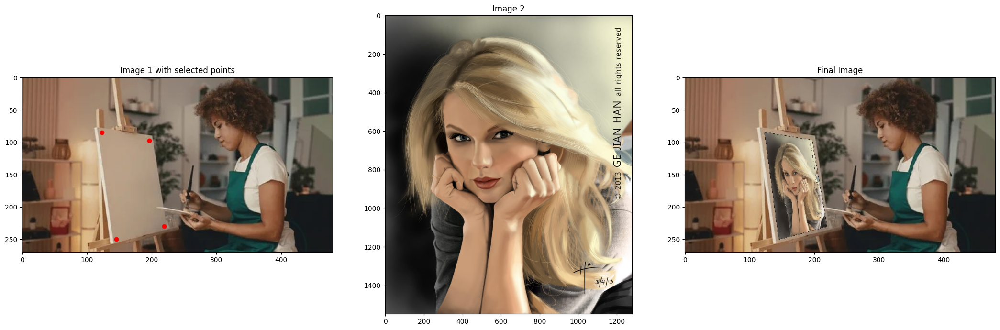

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Load the architectural image and the flag image
architectural_img = cv.imread('ArtBoard2.jpg')  # Replace with your architectural image path
flag_img = cv.imread('taylor_swift_art.jpg')  # Replace with the flag image path

if architectural_img is None or flag_img is None:
    print("Error: Could not load images. Please check the file paths.")
    exit()

# Initialize list to store points clicked by the user
points_architectural = []

# Mouse click event callback function
def select_points(event, x, y, flags, param):
    global points_architectural
    if event == cv.EVENT_LBUTTONDOWN:
        points_architectural.append([x, y])
        cv.circle(architectural_img_display, (x, y), 5, (0, 0, 255), -1)
        cv.imshow("Select 4 Points", architectural_img_display)

# Create a copy for display purposes
architectural_img_display = architectural_img.copy()

# Set up window and mouse callback
cv.namedWindow("Select 4 Points", cv.WINDOW_AUTOSIZE)
cv.setMouseCallback("Select 4 Points", select_points)

# Display the image until 4 points are selected
print("Click on four points on the architectural image to select the region for the flag.")
while len(points_architectural) < 4:
    cv.imshow("Select 4 Points", architectural_img_display)
    if cv.waitKey(10) & 0xFF == 27:  # Press 'Esc' key to exit if needed
        print("User canceled point selection.")
        cv.destroyAllWindows()
        exit()

cv.destroyAllWindows()

# Convert points to NumPy array of type float32
points_architectural = np.array(points_architectural, dtype='float32')

# Get the dimensions of the flag image
height, width, _ = flag_img.shape

# Define the four corners of the flag image
points_flag = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]], dtype='float32')

# Compute the homography matrix
homography_matrix, _ = cv.findHomography(points_flag, points_architectural)

# Warp the flag image to fit the selected region in the architectural image
warped_flag = cv.warpPerspective(flag_img, homography_matrix, (architectural_img.shape[1], architectural_img.shape[0]))

# Create a mask from the warped flag image
mask = np.zeros_like(architectural_img, dtype=np.uint8)
cv.fillConvexPoly(mask, points_architectural.astype(int), (255, 255, 255))

# Blend the warped flag image with reduced opacity to make it look more natural
alpha = 0.8  # Opacity level for blending
blended_warped_flag = cv.addWeighted(warped_flag, alpha, architectural_img, 1 - alpha, 0)

# Combine the blended flag with the architectural image
blended_img = cv.bitwise_and(architectural_img, cv.bitwise_not(mask)) + cv.bitwise_and(blended_warped_flag, mask)

# Plotting the results
fig, ax = plt.subplots(1, 3, figsize=(21, 7))
ax[0].imshow(cv.cvtColor(architectural_img, cv.COLOR_BGR2RGB))
ax[0].set_title("Image 1 with selected points")
for point in points_architectural:
    ax[0].plot(point[0], point[1], 'ro')

ax[1].imshow(cv.cvtColor(flag_img, cv.COLOR_BGR2RGB))
ax[1].set_title("Image 2")

ax[2].imshow(cv.cvtColor(blended_img, cv.COLOR_BGR2RGB))
ax[2].set_title("Final Image")

plt.tight_layout()
plt.show()

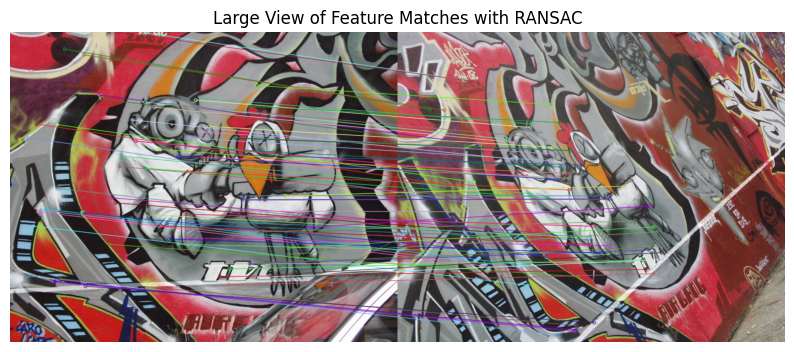

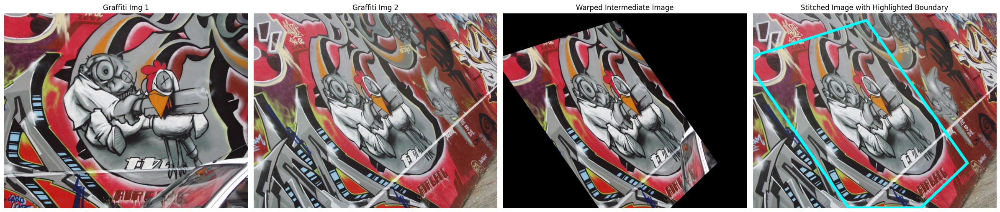

Computed Homography Matrix:
 [[ 6.52761162e-01  6.76929173e-01 -2.87891167e+01]
 [-1.49769351e-01  9.65158152e-01  1.49392999e+02]
 [ 4.07986271e-04 -1.63555855e-05  1.00000000e+00]]
Actual Homography Matrix from Dataset:
 [[ 6.6378505e-01  6.8003334e-01 -3.1230335e+01]
 [-1.4495500e-01  9.7128304e-01  1.4877420e+02]
 [ 4.2518504e-04 -1.3930359e-05  1.0000000e+00]]
Error between Computed and Actual Homography:
 2.5184619751388344


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import random

# Load the input images
img1 = cv.imread(r'.\graf\img1.ppm')  # Path to the first graffiti image
img5 = cv.imread(r'.\graf\img4.ppm')  # Path to the second graffiti image

if img1 is None or img5 is None:
    print("Error: Unable to load images. Verify the file paths.")
    exit()

# Step 1: Detect and match SIFT features between the two images
sift = cv.SIFT_create()

# Detect keypoints and compute descriptors for both images
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints5, descriptors5 = sift.detectAndCompute(img5, None)

# Match features using FLANN-based matcher
flann_index_kdtree = 1
index_params = dict(algorithm=flann_index_kdtree, trees=5)
search_params = dict(checks=100)
flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(descriptors1, descriptors5, k=2)

# Apply Lowe's ratio test to filter good matches
confidence_level = 0.85  # Set confidence level for filtering matches
good_matches = []
for m, n in matches:
    if m.distance < confidence_level * n.distance:
        good_matches.append(m)

# Draw the filtered matches
img_matches = cv.drawMatches(img1, keypoints1, img5, keypoints5, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Step 2: Estimate the homography using RANSAC
max_inliers = 0
best_homography = None
threshold = 2.0  # Threshold for considering inliers
iterations = 2000  # Number of iterations for RANSAC

# Extract the matched points
src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
dst_pts = np.float32([keypoints5[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

for _ in range(iterations):
    # Randomly select 4 points
    idx = random.sample(range(len(good_matches)), 4)
    src_sample = src_pts[idx]
    dst_sample = dst_pts[idx]

    # Compute homography matrix
    H, _ = cv.findHomography(src_sample, dst_sample, 0)
    if H is None:
        continue

    # Project points using the homography
    projected_pts = cv.perspectiveTransform(src_pts.reshape(-1, 1, 2), H).reshape(-1, 2)

    # Calculate the Euclidean distance between projected points and actual points
    distances = np.linalg.norm(dst_pts - projected_pts, axis=1)

    # Count the number of inliers
    inliers = np.sum(distances < threshold)

    # Update the best homography if a higher number of inliers is found
    if inliers > max_inliers:
        max_inliers = inliers
        best_homography = H

# Draw the inliers after RANSAC
if best_homography is not None:
    projected_pts = cv.perspectiveTransform(src_pts.reshape(-1, 1, 2), best_homography).reshape(-1, 2)
    inliers_mask = np.linalg.norm(dst_pts - projected_pts, axis=1) < threshold
    img_ransac_matches = cv.drawMatches(img1, keypoints1, img5, keypoints5, good_matches, None,
                                        matchesMask=inliers_mask.astype(int).tolist(), flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
else:
    print("RANSAC failed to compute a valid homography.")
    exit()

# Step 3: Stitch img1 onto img5
if best_homography is not None:
    height, width, _ = img5.shape
    stitched_img = cv.warpPerspective(img1, best_homography, (width, height))

    # Display the feature matches with RANSAC as a larger individual plot
    plt.figure(figsize=(10, 10))
    plt.imshow(cv.cvtColor(img_ransac_matches, cv.COLOR_BGR2RGB))
    plt.title('Large View of Feature Matches with RANSAC')
    plt.axis('off')
    plt.show()

    # Create masks for blending the stitched image
    mask_stitched = (stitched_img > 0).astype(np.uint8)
    img5_masked = cv.bitwise_and(img5, img5, mask=cv.bitwise_not(mask_stitched[:, :, 0]))

    # Apply feather blending to reduce visible seams
    overlap_region = (mask_stitched[:, :, 0] & (img5[:, :, 0] > 0)).astype(np.float32)
    alpha = cv.GaussianBlur(overlap_region, (21, 21), 0) / 255.0

    # Weighted blend in overlapping regions
    blended_img = np.uint8(stitched_img * alpha[:, :, None] + img5_masked * (1 - alpha[:, :, None]))

    # Draw a light pink boundary to highlight the stitched area
    pink_boundary = (mask_stitched[:, :, 0] > 0).astype(np.uint8)
    contours, _ = cv.findContours(pink_boundary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cv.drawContours(blended_img, contours, -1, (255, 255, 0), 7)  # Light blue color with thicker line
else:
    print("Homography could not be computed.")
    exit()

# Display the images side by side
fig, axes = plt.subplots(1, 4, figsize=(24, 12))

# Display the first graffiti image
axes[0].imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
axes[0].set_title('Graffiti Img 1')
axes[0].axis('off')

# Display the second graffiti image
axes[1].imshow(cv.cvtColor(img5, cv.COLOR_BGR2RGB))
axes[1].set_title('Graffiti Img 2')
axes[1].axis('off')

# Display the warped intermediate image
axes[2].imshow(cv.cvtColor(stitched_img, cv.COLOR_BGR2RGB))
axes[2].set_title('Warped Intermediate Image')
axes[2].axis('off')

# Display the final stitched image with highlighted boundary
axes[3].imshow(cv.cvtColor(blended_img, cv.COLOR_BGR2RGB))
axes[3].set_title('Stitched Image with Highlighted Boundary')
axes[3].axis('off')

plt.tight_layout()
plt.show()

# Print the homography matrix computed from the transformation
print("Computed Homography Matrix:\n", best_homography)

# Load the actual homography matrix from the dataset and compare
actual_homography_path = r'.\graf\H1to4p'
actual_homography = np.loadtxt(actual_homography_path)
print("Actual Homography Matrix from Dataset:\n", actual_homography)

# Calculate the error between the computed and the actual homography matrices
homography_error = np.linalg.norm(actual_homography - best_homography)
print("Error between Computed and Actual Homography:\n", homography_error)
